# Process Data

In [10]:
import numpy as np
import pandas as pd
import struct
import array
import plotly.express as px
import plotly.graph_objects as go
import math
import time
import scipy.signal

In [11]:
import onnx

In [12]:
import onnxruntime

In [13]:
from MotionPreprocessing import MotionProcessor, read_csv_style_data, read_csv_data, ReadBinary,FrameRange

In [14]:
pd.options.display.max_columns = None

In [15]:
NUM_PHASE_CHANNEL = 5

In [16]:
IN_FEATURES = 475
NUM_SAMPLES = 28349

In [17]:
mp = MotionProcessor()

In [18]:
dfInputDataExp = mp.input_preprocessing()

Running input preprocessing...
Reading binary C:\DEV\DATASETS\Survivor_Gen/data_x.bin... 100 % %
Raw input data shape: (132385, 403)
Array does not contain NaN values.
Input preprocessing completed in 204.49 seconds.


In [17]:
dfInputDataExp

Type                                File  \
SeqId Frame                                                 
1     6      Standard                  11_11_05_14_06.fbx   
      7      Standard                  11_11_05_14_06.fbx   
      8      Standard                  11_11_05_14_06.fbx   
      9      Standard                  11_11_05_14_06.fbx   
      10     Standard                  11_11_05_14_06.fbx   
...               ...                                 ...   
60    6525   Standard  Simon_Strave_Nav_Walk_original.fbx   
      6526   Standard  Simon_Strave_Nav_Walk_original.fbx   
      6527   Standard  Simon_Strave_Nav_Walk_original.fbx   
      6528   Standard  Simon_Strave_Nav_Walk_original.fbx   
      6529   Standard  Simon_Strave_Nav_Walk_original.fbx   

                                            SeqUUID  root_pos_x_0  \
SeqId Frame                                                         
1     6      {d8d13672-2b52-4689-9fb1-d608d0c2dc93}    249.317917   
      7      {d8d13672-2b52-4689-9fb1-d608d0c2dc93}    257.113647   
      8      {d8d13672-2b52-4689-9fb1-d608d0c2dc93}    263.779480   
      9      {d8d13672-2b52-4689-9fb1-d608d0c2dc93}    270.350830   
      10     {d8d13672-2b52-4689-9fb1-d608d0c2dc93}    276.750854   
...                                             ...           ...   
60    6525   {3244f5bf-5f96-477a-9725-e1c8bbd11848}      8.730961   
      6526   {3244f5bf-5f96-477a-9725-e1c8bbd11848}      9.008110   
      6527   {3244f5bf-5f96-477a-9725-e1c8bbd11848}      9.369236   
      6528   {3244f5bf-5f96-477a-9725-e1c8bbd11848}      9.707539   
      6529   {3244f5bf-5f96-477a-9725-e1c8bbd11848}     10.020039   

             root_pos_y_0  root_fwd_x_0  root_fwd_y_0  root_vel_x_0  \
SeqId Frame                                                           
1     6       -113.969009     -0.847921      0.530123     -0.655744   
      7       -112.448547     -0.852142      0.523310     -0.674517   
      8       -110.052917     -0.855884      0.517169     -0.778586   
      9       -107.326721     -0.859160      0.511707     -0.856923   
      10      -104.684998     -0.861984      0.506935     -0.869440   
...                   ...           ...           ...           ...   
60    6525     -78.550629      0.000000      1.000000      0.152576   
      6526     -77.899513      0.000000      1.000000      0.147745   
      6527     -77.632713      0.000000      1.000000      0.196122   
      6528     -77.465332      0.000000      1.000000      0.199993   
      6529     -77.208420      0.000000      1.000000      0.186162   

             root_vel_y_0  root_speed_0  root_pos_x_1  root_pos_y_1  \
SeqId Frame                                                           
1     6          0.341542      0.739358    231.996536   -105.592117   
      7          0.350325      0.760066    238.041046   -103.936707   
      8          0.395857      0.873441    242.912857   -101.525482   
      9          0.417649      0.953282    248.124725    -99.022949   
      10         0.408742      0.960726    252.727722    -96.468719   
...                   ...           ...           ...           ...   
60    6525       1.374270      1.382714     10.803856    -65.020538   
      6526       1.033024      1.043536     10.835907    -64.850304   
      6527       0.845030      0.867490     10.875626    -64.842873   
      6528       0.788515      0.813482     10.787437    -64.799179   
      6529       0.807285      0.828471     10.697899    -64.726913   

             root_fwd_x_1  root_fwd_y_1  root_vel_x_1  root_vel_y_1  \
SeqId Frame                                                           
1     6         -0.784912      0.619608     -1.429143      0.585019   
      7         -0.786728      0.617300     -1.643171      0.604659   
      8         -0.788081      0.615572     -1.773136      0.592768   
      9         -0.788979      0.614420     -1.592146      0.484941   
      10        -0.789429      0.613841     -1.8708

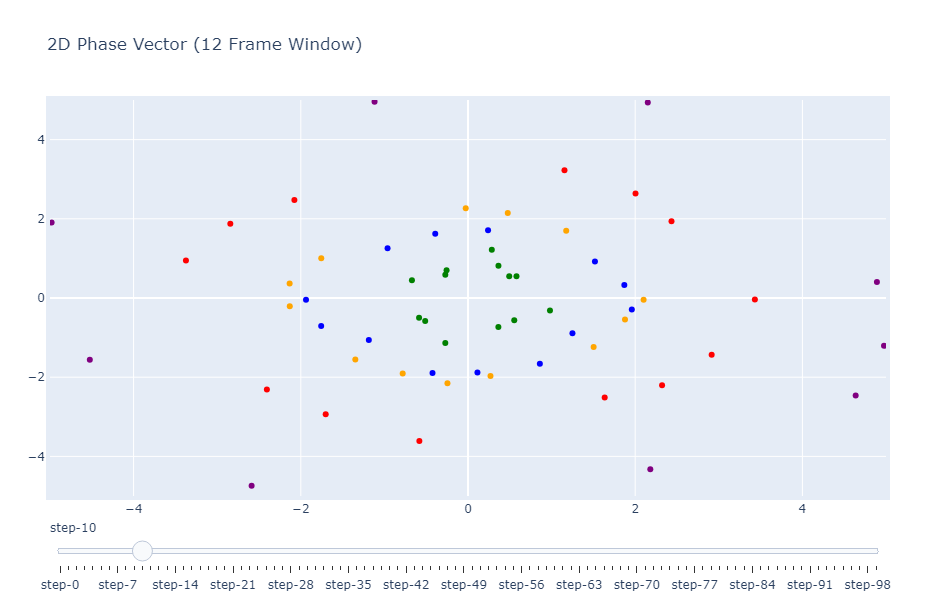

In [18]:
fig = go.Figure()

# Extract columns that start with 'PhaseSpace-'
phasespace_columns = [col for col in dfInputDataExp.columns if col.startswith('PhaseSpace-')]
# Filter even and odd indices based on numerical part of column names
even_indices = [col for col in phasespace_columns if int(col.split('-')[-1]) % 2 == 0]
odd_indices = [col for col in phasespace_columns if int(col.split('-')[-1]) % 2 != 0]

colors = ['red', 'green', 'blue', 'orange', 'purple']

for step in range(3000,3100):
    row = dfInputDataExp.iloc[step]
    
    # Extract values based on even and odd indices
    p_y = row[even_indices].values.flatten()
    p_x = row[odd_indices].values.flatten()

    # Assign colors to each point, cycling through the colors list every 5 points
    marker_colors = [colors[i % len(colors)] for i in range(len(p_x))]

    fig.add_trace(
            go.Scatter(
                visible=False,
                mode='markers',
                x=p_x,
                y=p_y,
                marker=dict(color=marker_colors)  # Set marker colors
            ))
    
fig.data[0].visible = True

steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": "Step: " + str(i)}],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)
fig.update_scenes(aspectmode='cube',aspectratio=dict(x=1, y=1))

fig.update_layout(
    title = "2D Phase Vector (12 Frame Window)",
    xaxis=dict(range=[-5, 5]), 
    yaxis=dict(range=[-5, 5]),  
    autosize=False,
    width=500,
    height=600,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
)

fig.show()

In [19]:
fig.write_html("file_phase.html", include_plotlyjs=False)

### Build Output Features

In [19]:
OUT_FEATURES = 436

In [20]:
dfOutDataExp = mp.output_preprocessing()

Running output preprocessing...
Reading binary C:\DEV\DATASETS\Survivor_Gen/data_y.bin... 100 % %
Output preprocessing completed in 167.4 seconds.


In [21]:
dfOutDataExp

Type                                File  \
SeqId Frame                                                 
1     6      Standard                  11_11_05_14_06.fbx   
      7      Standard                  11_11_05_14_06.fbx   
      8      Standard                  11_11_05_14_06.fbx   
      9      Standard                  11_11_05_14_06.fbx   
      10     Standard                  11_11_05_14_06.fbx   
...               ...                                 ...   
60    6525   Standard  Simon_Strave_Nav_Walk_original.fbx   
      6526   Standard  Simon_Strave_Nav_Walk_original.fbx   
      6527   Standard  Simon_Strave_Nav_Walk_original.fbx   
      6528   Standard  Simon_Strave_Nav_Walk_original.fbx   
      6529   Standard  Simon_Strave_Nav_Walk_original.fbx   

                                            SeqUUID   delta_x   delta_y  \
SeqId Frame                                                               
1     6      {d8d13672-2b52-4689-9fb1-d608d0c2dc93} -7.006241  3.338425   
      7      {d8d13672-2b52-4689-9fb1-d608d0c2dc93} -6.120155  2.578125   
      8      {d8d13672-2b52-4689-9fb1-d608d0c2dc93} -6.231888  2.315384   
      9      {d8d13672-2b52-4689-9fb1-d608d0c2dc93} -6.155640  2.406693   
      10     {d8d13672-2b52-4689-9fb1-d608d0c2dc93} -5.278168  2.294006   
...                                             ...       ...       ...   
60    6525   {3244f5bf-5f96-477a-9725-e1c8bbd11848} -0.030907  1.070599   
      6526   {3244f5bf-5f96-477a-9725-e1c8bbd11848} -0.034252  1.141586   
      6527   {3244f5bf-5f96-477a-9725-e1c8bbd11848} -0.004978  1.146809   
      6528   {3244f5bf-5f96-477a-9725-e1c8bbd11848} -0.002228  1.088558   
      6529   {3244f5bf-5f96-477a-9725-e1c8bbd11848} -0.005840  1.165077   

             delta_angle  out_root_pos_x_7  out_root_pos_y_7  \
SeqId Frame                                                    
1     6        -0.016609        -58.655777         26.353577   
      7        -0.016327        -59.187881         25.742645   
      8        -0.016039        -59.733139         25.347122   
      9        -0.015747        -60.000946         24.715118   
      10       -0.015441        -61.396912         24.277618   
...                  ...               ...               ...   
60    6525     -0.000000          0.299576         11.912231   
      6526     -0.000000          0.467056         12.223209   
      6527     -0.000000          0.596653         12.483990   
      6528     -0.000000          0.733547         12.906418   
      6529     -0.000000          0.887791         13.261311   

             out_root_fwd_x_7  out_root_fwd_y_7  out_root_vel_x_7  \
SeqId Frame                                                         
1     6              0.149217          0.988805         -3.418437   
      7              0.146195          0.989256         -3.762599   
      8              0.143147          0.989701         -3.844904   
      9              0.140081          0.990140         -3.641337   
      10             0.137001          0.990571         -3.800623   
...                       ...               ...               ...   
60    6525           0.000000          1.000000          0.070083   
      6526           0.000000          1.000000          0.079938   
      6527           0.000000          1.000000          0.074767   
      6528           0.000000          1.000000          0.080800   
      6529           0.000000          1.000000          0.089042   

             out_root_vel_y_7  out_root_speed_7  out_root_pos_x_8  \
SeqId Frame                                                         
1     6              1.648677          3.795240       -117.725433   
      7              1.696967          4.127572       -117.248245   
      8              1.663383          4.189287       -116.328812   
      9              1.572672          3.966438       -115.657104   
      10             1.622627          4.132512       -115.977005   
...                       ...    

In [2]:
df = dfOutDataExp


fig = px.box(
    df,
    x="File",  # Grouping variable
    y="out_jpos_y_head",  # Variable for distribution
    title="Speed Distribution Grouped by File Name",
    labels={"out_jpos_y_head": "Speed (units)", "File": "File Name"},
    template="plotly_white"
)


fig.show()

NameError: name 'dfOutDataExp' is not defined

In [1]:
df = df[df["File"]== "11_11_05_14_06.fbx"]
df

NameError: name 'df' is not defined

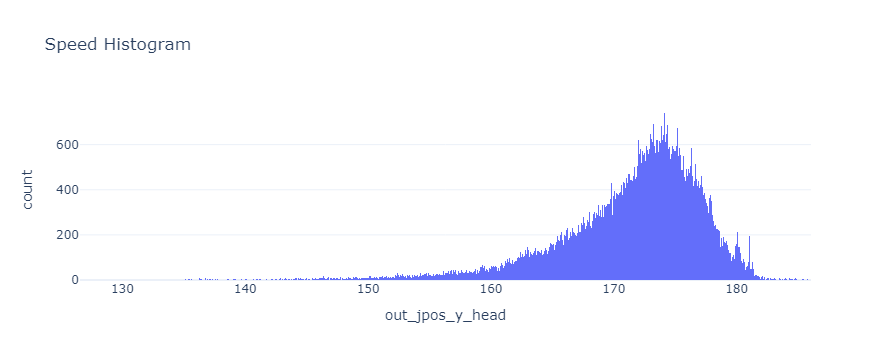

In [39]:
# Create the histogram
fig = px.histogram(
    dfOutDataExp,
    x="out_jpos_y_head",  # Column to plot
    nbins=2000,   # Number of bins (adjust as needed)
    title="Speed Histogram",
    labels={"speed": "Speed (units)"},  # Axis label customization
    template="plotly_white"  # Optional: Choose a template for styling
)

# Show the plot
fig.show()

In [39]:
sequence = dfOutDataExp.xs(key=10, level="SeqId")

In [40]:
smoothed = scipy.signal.savgol_filter(sequence["out_jvel_y_hand_L"],10,5)

In [41]:
fc = 3.25
w = fc / (60/2)
print(w)
b, a = scipy.signal.butter(5, w, 'low')
buttered = scipy.signal.filtfilt(b, a, sequence["out_jvel_y_hand_L"]) 

0.10833333333333334


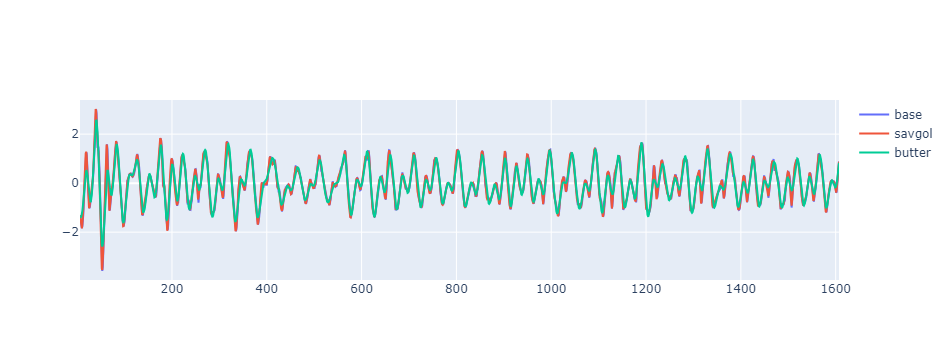

In [42]:
fig = go.Figure()

#add traces 
fig.add_trace(go.Scatter(x=sequence.index , y=sequence["out_jvel_y_hand_L"], name='base'))

fig.add_trace(go.Scatter(x=sequence.index, y = smoothed, name='savgol'))

fig.add_trace(go.Scatter(x=sequence.index, y = buttered, name='butter'))

fig.show()

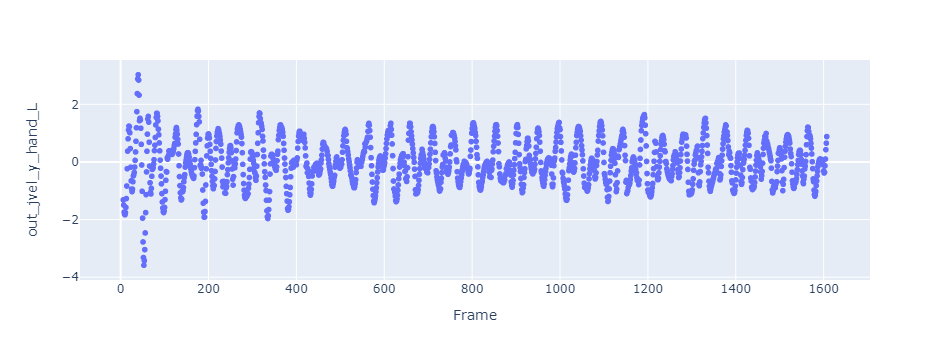

In [43]:
px.scatter(sequence,  y="out_jvel_y_hand_L")

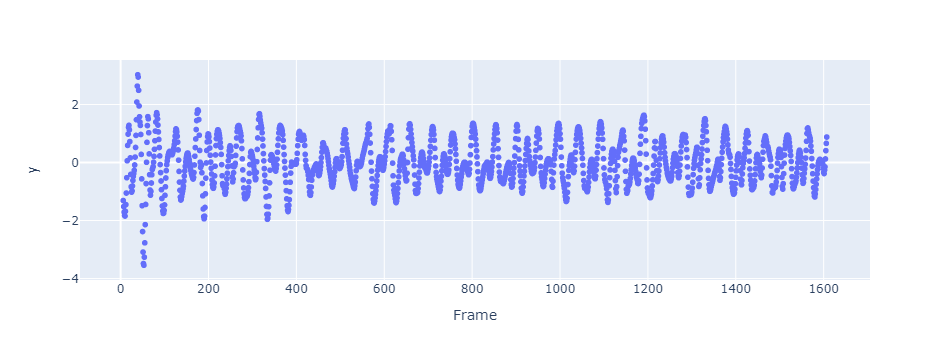

In [44]:
px.scatter(sequence,  y=smoothed)

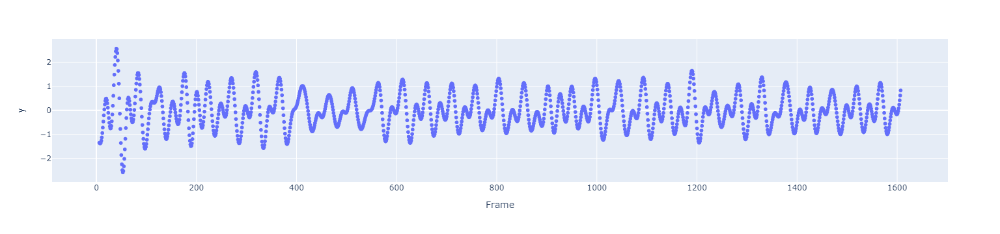

In [45]:
px.scatter(sequence,  y=buttered)

In [46]:
def translation_matrix(dx, dy, dz):
    """Create a 4x4 translation matrix."""
    return np.array([
        [1, 0, 0, dx],
        [0, 1, 0, dy],
        [0, 0, 1, dz],
        [0, 0, 0, 1]
    ])

def rotation_matrix_y(theta):
    """Create a 4x4 rotation matrix around the Y-axis."""
    cos_theta = np.cos(theta)
    sin_theta = np.sin(theta)
    return np.array([
        [cos_theta, 0, sin_theta, 0],
        [0, 1, 0, 0],
        [-sin_theta, 0, cos_theta, 0],
        [0, 0, 0, 1]
    ])

In [47]:
import matplotlib.pyplot as plt

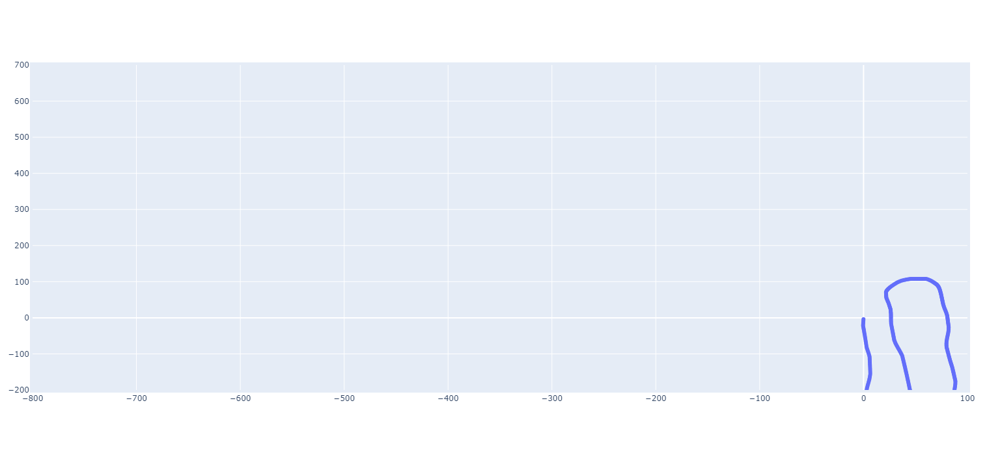

In [48]:
p_x =[]
p_y =[]

root = np.eye(4)
origin = [0.0,0.0,0.0,1.0]

position = [0,0,0,1]
for index, row in sequence.iterrows():
    #, y = rotate_vector(row.delta_x, row.delta_y, angle)
    t_mat = translation_matrix(row.delta_x, 0.0, row.delta_y)
    rot_mat = rotation_matrix_y(-row.delta_angle)
    
    tout =  rot_mat @ t_mat 
    
    root =  root @ tout

    pos = root @ origin
    
    p_x.append(pos[0])
    p_y.append(pos[2])

# Create the plot with Plotly
fig = go.Figure()

fig.add_trace(go.Scatter(x=p_x, y=p_y, mode='markers', name='Position'))

# Set the aspect ratio and axis ranges


fig.update_layout(

    xaxis=dict(range=[-800, 100]), 
    yaxis=dict(range=[-200, 700]),  
    autosize=False,
    width=600,
    height=700,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
)
#fig.update_xaxes(constrain='domain')  
#fig.update_yaxes(scaleanchor= 'x')
#fig['layout'].update(scene=dict(aspectmode="data"))

fig.show()

## Export Data

In [25]:
mp.export_data()

Exporting data...
Input data shape: (121727, 533)
Exporting output data...
Output data shape: (121727, 497)


In [26]:
test = mp.OutputData.iloc[200]

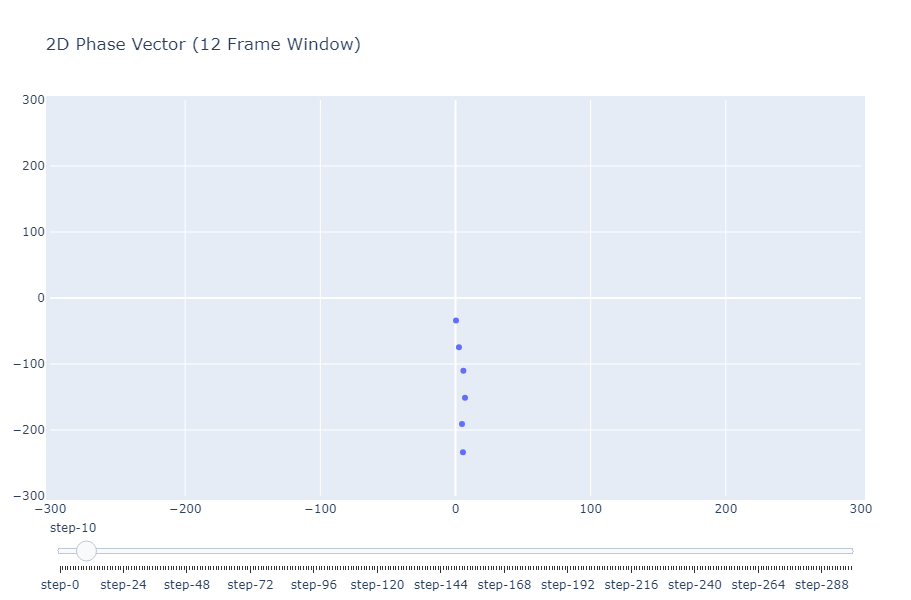

In [27]:
fig = go.Figure()

# Extract columns that start with 'PhaseSpace-'
#phasespace_columns = [col for col in dfInputDataExp.columns if col.startswith('root_pos')]
phasespace_columns = [col for col in sequence.columns if 'root_pos' in col]
# Filter even and odd indices based on numerical part of column names
even_indices = [col for col in phasespace_columns if "y" in col]
odd_indices = [col for col in phasespace_columns if "x" in col]

for step in range(300):
    #row = dfInputDataExp.iloc[step]
    row = sequence.iloc[step]
    
    # Extract values based on even and odd indices
    p_y = row[even_indices].values.flatten()
    p_x = row[odd_indices].values.flatten()

    fig.add_trace(
            go.Scatter(
                visible=False,
                mode='markers',
                name="𝜈 = " + str(step),
                x=p_x,
                y=p_y))
    
fig.data[0].visible = True

steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": "Step: " + str(i)}],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)
fig.update_scenes(aspectmode='cube',aspectratio=dict(x=1, y=1))

fig.update_layout(
    title = "2D Phase Vector (12 Frame Window)",
    xaxis=dict(range=[-300, 300]), 
    yaxis=dict(range=[-300, 300]),  
    autosize=False,
    width=500,
    height=600,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
)

fig.show()

## Inference

In [ ]:
model_path = r"C:\DEV\AI4Animation\AI4Animation\SIGGRAPH_2022\PyTorch\GNN\Training\144.onnx"

In [ ]:
#onnx setup
session = onnxruntime.InferenceSession(model_path)
inputs = session.get_inputs()
outputs = session.get_outputs()

In [ ]:
# Check network input and output dimensions
[print(f"{n.name}, {n.shape}") for n in inputs]
[print(f"{n.name}, {n.shape}") for n in outputs]

In [ ]:
# Load previously created input binary
test_in = ReadBinary(r"C:\DEV\AnimHost\python\data\Input.bin", 600, 605)
df_inference_input = pd.DataFrame(test_in, columns=mp.get_raw_input_columns())
x_in = df_inference_input.iloc[500].to_numpy(dtype=np.float32).reshape(1,-1)

In [ ]:
# Load previously created output binary
y_groundtruth =  ReadBinary(r"C:\DEV\AnimHost\python\data\Output.bin", 600, 576)
df_groundtruth = pd.DataFrame(y_groundtruth, columns=mp.get_raw_output_columns())

In [ ]:
# Time before code execution
start_time = time.time()


result = session.run(["Y","W"], {"X" : x_in})

# Time after code execution
end_time = time.time()
delta_time = end_time - start_time
print(f"Code execution took {delta_time:.4f} seconds.")

In [ ]:
mp.get_raw_output_columns()

In [ ]:
df_inference_output =  pd.DataFrame(result[0], columns=mp.get_raw_output_columns())

In [ ]:
row_to_plot = df_inference_output.loc[[0]] 

fig = px.scatter(x=row_to_plot["delta_x"], y=row_to_plot["delta_y"])



for i in range(6,12):
    fig.add_scatter(x=row_to_plot[f"out_root_pos_x_{i}"], y=row_to_plot[f"out_root_pos_y_{i}"], mode="markers", marker_symbol="x")

fig.update_traces(marker=dict(size=12,
                              opacity=0.5,
                              line=dict(width=2,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.update_layout(
    width = 800,
    height = 800,
    title = "fixed-ratio axes"
)
fig.update_yaxes(
    scaleanchor = "x",
    scaleratio = 1,
  )

fig.show()

In [ ]:
x_columns = df_inference_output.filter(like="out_jpos_x_").values
y_columns = df_inference_output.filter(like="out_jpos_y_").values
z_columns = df_inference_output.filter(like="out_jpos_z_").values

# Flatten the arrays if needed
x_array = x_columns.flatten()
y_array = y_columns.flatten()
z_array = z_columns.flatten()

In [ ]:
inx = df_inference_input.iloc[0].filter(like="jpos_x_").values.flatten()
iny = df_inference_input.iloc[0].filter(like="jpos_y_").values.flatten()
inz = df_inference_input.iloc[0].filter(like="jpos_z_").values.flatten()


In [ ]:
scatter_data = pd.DataFrame({'X': x_array, 'Y': y_array, 'Z': z_array})


max_range = max(scatter_data[['X', 'Y', 'Z']].max())
min_range = min(scatter_data[['X', 'Y', 'Z']].min())

fig = px.scatter_3d(scatter_data, x='X', y='Z', z='Y', title='Out Joint Positions', labels={'X': 'X Values', 'Y': 'Y Values', 'Z': 'Z Values'})
fig.update_traces(name='Out Joint Positions', showlegend = True)
fig.add_scatter3d(x=inx, y=inz, z=iny, mode="markers", name='In Joint Positions')

fig.update_layout(scene=dict(aspectmode="cube", xaxis=dict(range=[min_range, max_range]), yaxis=dict(range=[min_range, max_range]), zaxis=dict(range=[min_range, max_range])))

fig.update_layout(
    width = 800,
    height = 800,
    title = "Joint Position In & Out (Next Frame)"
)
fig.update_traces(marker_size = 3)
fig.show()

In [ ]:
x_columns = df_inference_output.filter(like="out_jrot_0_").values
y_columns = df_inference_output.filter(like="out_jrot_1_").values
z_columns = df_inference_output.filter(like="out_jrot_2_").values

# Flatten the arrays if needed
x_array = x_columns.flatten()
y_array = y_columns.flatten()
z_array = z_columns.flatten()

inx = df_inference_input.iloc[0].filter(like="jrot_0_").values.flatten()
iny = df_inference_input.iloc[0].filter(like="jrot_1_").values.flatten()
inz = df_inference_input.iloc[0].filter(like="jrot_2_").values.flatten()



scatter_data = pd.DataFrame({'X': x_array, 'Y': y_array, 'Z': z_array})


max_range = max(scatter_data[['X', 'Y', 'Z']].max())
min_range = min(scatter_data[['X', 'Y', 'Z']].min())

fig = px.scatter_3d(scatter_data, x='X', y='Z', z='Y', title='Out Joint Positions', labels={'X': 'X Values', 'Y': 'Y Values', 'Z': 'Z Values'})
fig.update_traces(name='Out Joint Positions', showlegend = True)
fig.add_scatter3d(x=inx, y=inz, z=iny, mode="markers", name='In Joint Positions')

#fig.update_layout(scene=dict(aspectmode="cube", xaxis=dict(range=[min_range, max_range]), yaxis=dict(range=[min_range, max_range]), zaxis=dict(range=[min_range, max_range])))

fig.update_layout(
    width = 800,
    height = 800,
    title = "Joint Position In & Out (Next Frame)"
)

fig.update_traces(marker_size = 3)
fig.show()

### Velocity preprocessing

In [ ]:
dataset_path = r"C:\DEV\DATASETS\Survivor_Gen"
num_samples = 60917
num_feature = 96

In [ ]:
velocities = ReadBinary(dataset_path + "/joint_velocity.bin", num_samples, num_feature)
df_velocities = pd.DataFrame(velocities)
velocity_ids = read_csv_data(dataset_path + "/sequences_velocity.txt")
velocity_ids.columns = ["SeqId","Frame","Type", "File","SeqUUID"]
df_velocities = pd.concat([velocity_ids, df_velocities], axis=1)
df_velocities.set_index(["SeqId","Frame"],inplace = True)

In [ ]:
num_sequences = df_velocities.index.get_level_values('SeqId').nunique()

#prepare filter
fc = 3.25
w = fc / (60/2)
print(w)
b, a = scipy.signal.butter(5, w, 'low')
#buttered = scipy.signal.filtfilt(b, a, sequence["out_jvel_y_hand_L"]) 
result_sequences = []

for n in range(34):
    #select sequence by index
    sequence = df_velocities.xs(key=n+1, level="SeqId")
    butterw_combined = []
    #apply butterworth to every column
    for col in range(num_feature):
        butterw_result = scipy.signal.filtfilt(b, a, sequence[col])
        butterw_combined.append(butterw_result)

    result_sequences.append(np.vstack(butterw_combined).T)

final = np.vstack(result_sequences)
df_final = pd.DataFrame(final)
df_final

In [ ]:
fig = go.Figure()

#add traces 
fig.add_trace(go.Scatter(x=df_final.index , y=df_velocities[40], name='base'))
fig.add_trace(go.Scatter(x=df_final.index , y=df_final[40], name='base'))

fig.show()

In [ ]:
out_array = array.array('d', df_final.to_numpy(dtype=np.float32).flatten())
with open(dataset_path+ "/p_velocity.bin", 'wb') as file:
    s = struct.pack('f'*len(out_array), *out_array)
    file.write(s)

In [ ]:
def repeat(t, length):
    """
    Loops the value t so that it is never larger than length and never smaller than 0.
    
    Parameters:
    t (float): The value to be looped.
    length (float): The maximum length to loop within.
    
    Returns:
    float: The looped value.
    """
    if length == 0:
        return 0  # Handle the case where length is zero to avoid division by zero.
    return t % length

In [ ]:
repeat(-0.3958188,1.0)

In [ ]:
mp.PhaseData